Vojtech Kopecky, CTU in Prague, 2023

# Abstract
This work introduces the successful usage of principal component analysis on a rheocasted aluminum parts, thanks to a novel approach to pole selection in experimental modal analysis. Five parts are measured, their vibrations are processed, and modal parameters are estimated. The principal component analysis clearly suggests that modal frequencies of those parts may be good indicators of their health, provided that the modal identification is precise enough.

# Application description

## Rheocasting
Rheocasting is a method of semi-solid metal casting done at a temperature between liquidus and solidus. It produces metals with globular structures, where following heat treatment may be used for improving the strength of the material. Shrinkage is also lower due to lower temperatures during casting. 

The above leads to the possibility of producing parts with thinner walls causing significant weight reduction, as a picture of industrial application below illustrates.

Following figure and information reference: https://kovolis-hedvikov.cz/rheocasting/:

![rheocasting](rheocasting.jpg)

## Measurement
Experimental modal analysis measurement was carried out on five rheocasted aluminum parts used in industrial application. Two last of those parts are suspected to be defective due to poor quality of the casted mixture. The ability to distinguish between defective and non-defective parts by non-destructive testing would be significantly beneficial for the industry. The figure of the part on the measurement stand follows:

![image of part](measurement_part.jpg)

Each part was measured four times, the part was dismounted from the measuring stand and mounted on it again to ensure measurement error from mounting differences will equally distributed on all measurements. 

The vibration was excited by an in-house developed mechatronic hammer, and 49 points on the part were measured using a laser vibrometer in three directions (x, y, z), resulting in 147 FRFs. 

Measurements may be accessed at: https://campuscvut-my.sharepoint.com/:f:/g/personal/kopecvo2_cvut_cz/EjqIPAJkpa5JlowOmD8zgboBfYC-6OnxhVr42lZJKhHJcA?e=ONA1Tp. 

Figure of measurement setup follows:

![image of measurement](measurement_setup.jpg)

# Histogram based pole selection with intervals

The goal is to develop a method that would classify FRF measurements into classes defective and non-defective. There are two possible approaches:

a) Using statistical methods such as deep neural networks directly on unprocessed measured data.

b) Identification of modal parameters and using unsupervised learning on those parameters to make the classification.

The first approach is inappropriate in this case since we have a limited amount of measurements which would inevitably lead to overfitting of DNNs. The second approach is immune to overfitting and an assumption that the part will behave as a linear mechanical system may lead to a reduction of the influence of measurement noise. However, an error in modal parameters estimation is often significant, not only due to measurement error but to a large extent due to estimation error itself. 

The method presented in this paper will utilize principal component analysis (PCA) of identified modal parameters to decide, whether it is possible to make classification based on those parameters. Using known EMA algorithms for pole selection, for example, the complex mode indicator function in MESCOPE, led to the identification of different numbers of modal parameters for different parts, selecting closest poles from the stability chart, leads to strong modal parameter estimation errors as the modal frequencies slightly change in different parts. To solve this problem, a new algorithm of histogram-based pole selection from frequency intervals was developed and its usage is shown below. More detailed information about the algorithm may be obtained from the attached source code, or from the next jupyter notebook, which will be completed soon.


In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib as mpl
import PyQt6
import warnings
from IPython.display import set_matplotlib_formats
import matplotlib.pyplot as plt

import tools as tl # Import of tools made in this project
import stat_tools as stat # Import of tools made in this project

path_to_data = ['UFF_with_FRF_aluminum_casting/']

tl.plt.rcParams['figure.figsize'] = [10, 6] # Set figure size

warnings.filterwarnings('ignore') # Suppres warnings

%matplotlib inline
set_matplotlib_formats('pdf', 'svg') # produce vector inline graphics



## Selection of intervals
First, list of intervals is created. Programme will be looking for amount of peaks specified in last column in interval of frequency specified in first two columns. They do not have to be in increasing order and they may overlap each other, in that case, first mentioned interval has priority to choose most signifficant pole.

In [2]:
intervals = [[1200, 1450, 1],
             [1450, 2900, 1],
             [2900, 3400, 1],
             [3700, 4300, 1],
             [5200, 5700, 1],
             [6000, 6500, 2],
             [7000, 8000, 3],
             [8000, 10000, 6]
             ]

## EMA for FRF measurement
Function proc() defined lower creates object part of class **ModelEMA**, **ModelEMA.model** contains object class EMA from sdypy-EMA from https://github.com/sdypy/sdypy-EMA.git. It automatically computes the stabilization diagram using LSCE. 

Method **get_stable_poles** selects stable poles from the stabilization diagram. Method **poles_from_intervals** creates a histogram of stable poles and in intervals defined in intervals finds histogram bins with maximal value. From poles in this bin, it creates another histogram over the damping axis and finds the most likely pole(s) for each interval.

Method **reconstruct_avg** uses LSFD from sdypy-EMA to compute modal constants including modal vectors and plots comparison of measured and reconstructed FRF in the mean of log of the magnitude of FRF graph. 

If you wish to look closer at the comparison of reconstructed FRFs, use method **reconstruct_scroll()** which opens a window in which you can scroll through all FRFs. Example: **p11.reconstruct_scroll()**.

If you want to zoom or export any figure, use **%matplotlib qt** at beginning of respective cell and **%matplotlib inline** at the end. When you run the cell again, the plot is opened in separate window. 

In [3]:
measurements = []

def proc(path):
    part = tl.ModelEMA(path_to_data[0], path, units='[m/(s*N)]')

    part.get_stable_poles()

    part.poles_from_intervals(intervals)

    part.reconstruct_avg()
    
    measurements.append(part)
    
    return part

## EMA Processing of all measurements
Measured FRF's are processed below by the method described above.

 ... (more hidden) ...
 ... (more hidden) ...


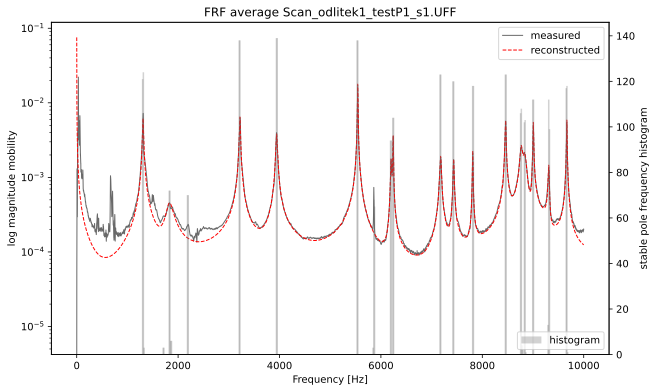

In [4]:
# Part 1, measurement 1
p11 = proc('Scan_odlitek1_testP1_s1.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


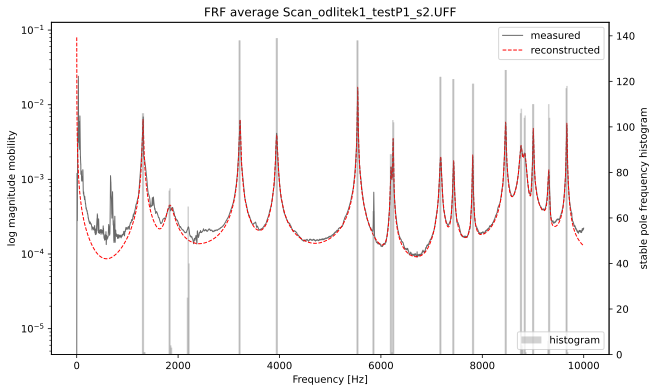

In [5]:
p12 = proc('Scan_odlitek1_testP1_s2.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


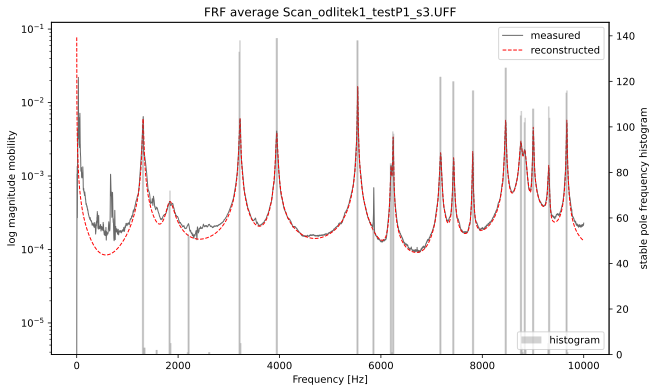

In [6]:
p13 = proc('Scan_odlitek1_testP1_s3.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


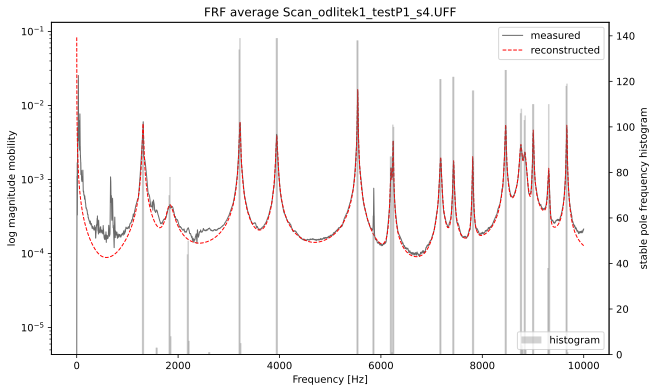

In [7]:
p14 = proc('Scan_odlitek1_testP1_s4.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


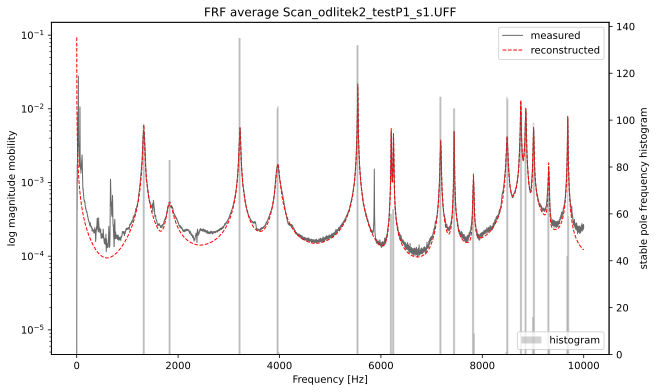

In [8]:
p21 = proc('Scan_odlitek2_testP1_s1.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


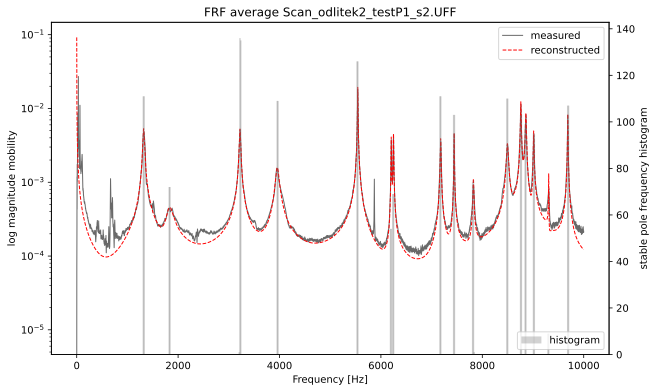

In [9]:
p22 = proc('Scan_odlitek2_testP1_s2.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


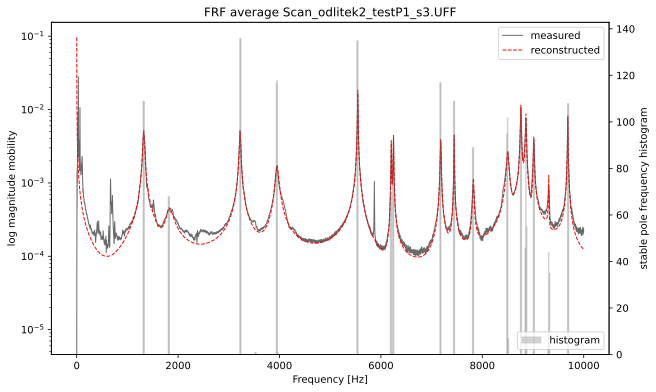

In [10]:
p23 = proc('Scan_odlitek2_testP1_s3.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


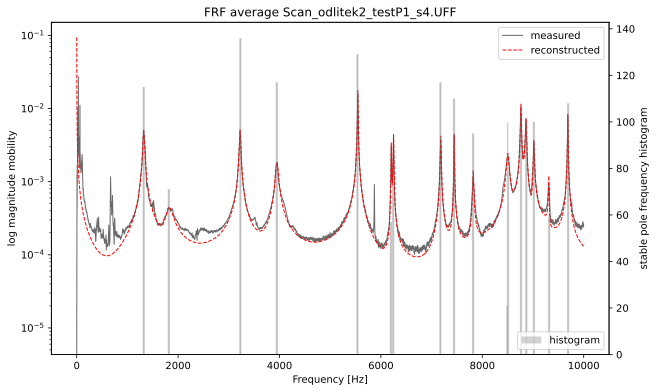

In [11]:
p24 = proc('Scan_odlitek2_testP1_s4.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


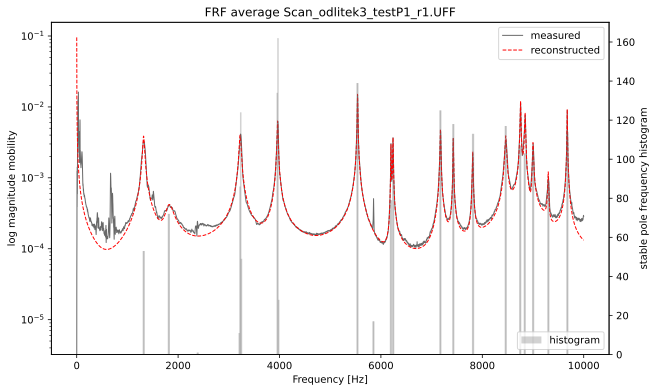

In [12]:
p31 = proc('Scan_odlitek3_testP1_r1.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


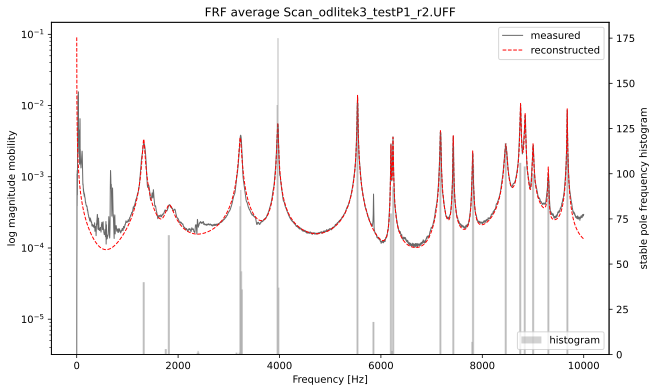

In [13]:
p32 = proc('Scan_odlitek3_testP1_r2.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


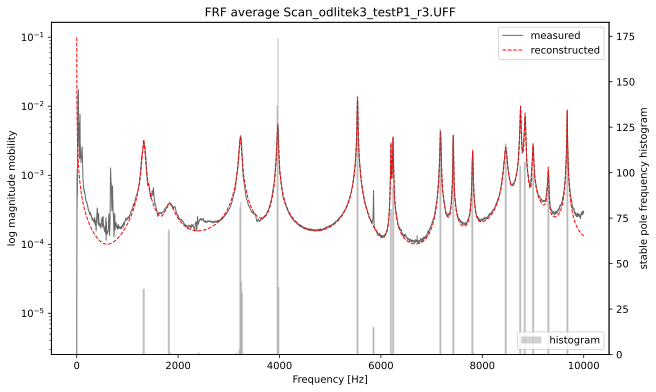

In [14]:
p33 = proc('Scan_odlitek3_testP1_r3.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


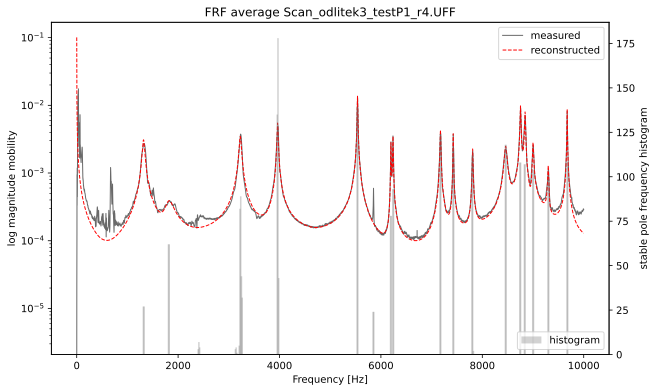

In [15]:
p34 = proc('Scan_odlitek3_testP1_r4.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


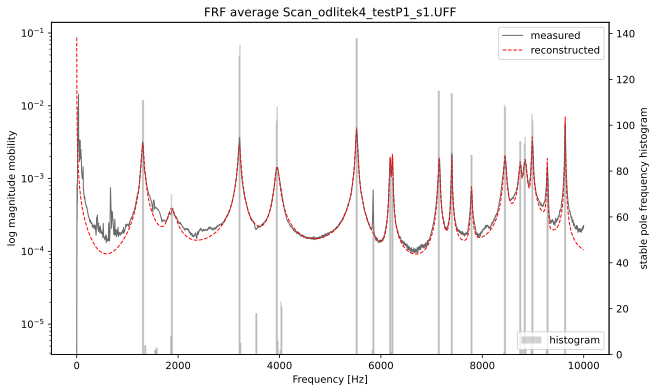

In [16]:
p41 = proc('Scan_odlitek4_testP1_s1.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


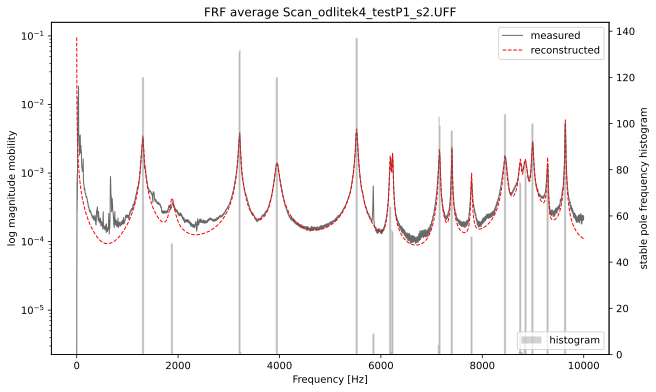

In [17]:
p42 = proc('Scan_odlitek4_testP1_s2.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


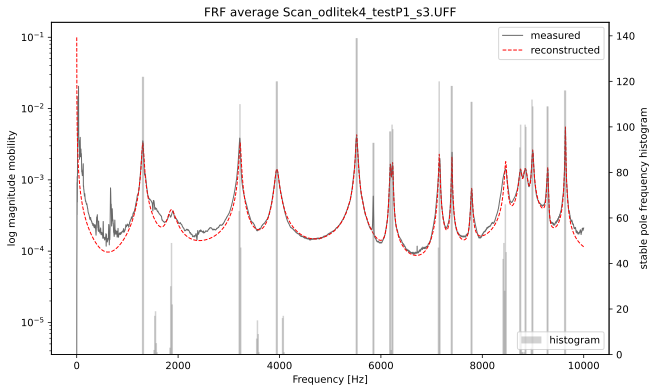

In [18]:
p43 = proc('Scan_odlitek4_testP1_s3.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


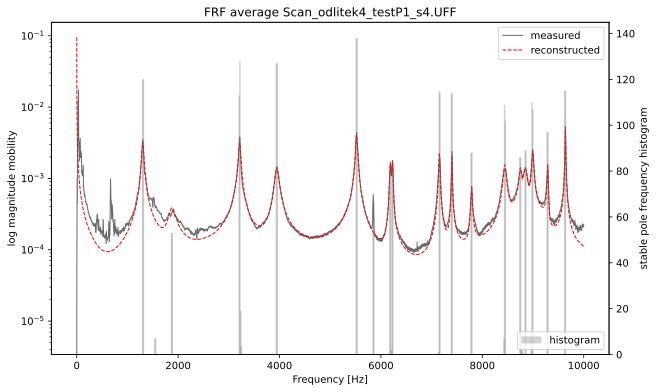

In [19]:
p44 = proc('Scan_odlitek4_testP1_s4.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


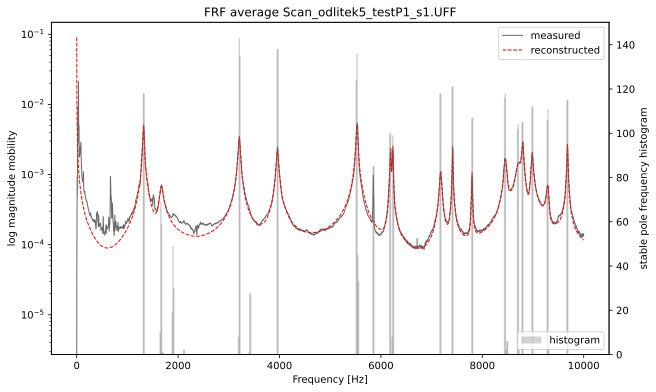

In [20]:
p51 = proc('Scan_odlitek5_testP1_s1.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


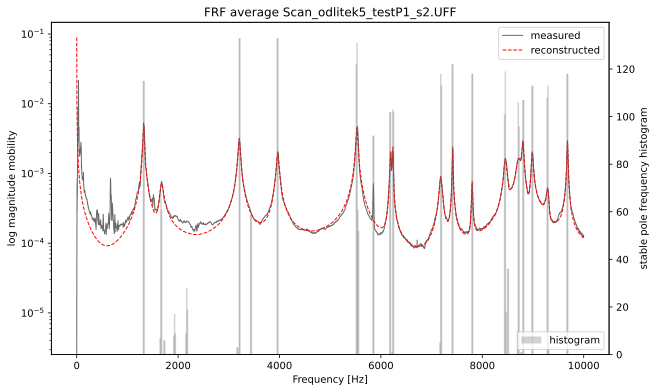

In [21]:
p52 = proc('Scan_odlitek5_testP1_s2.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


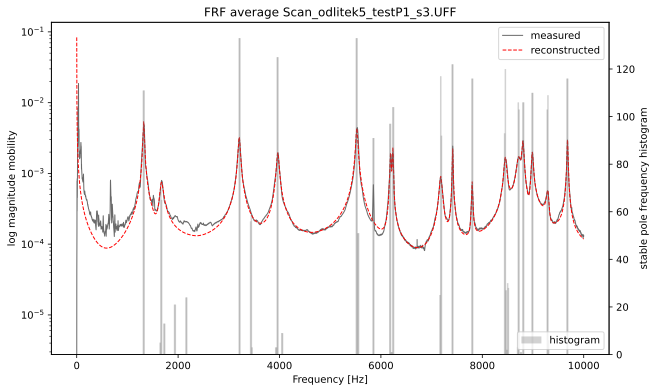

In [22]:
p53 = proc('Scan_odlitek5_testP1_s3.UFF')

 ... (more hidden) ...
 ... (more hidden) ...


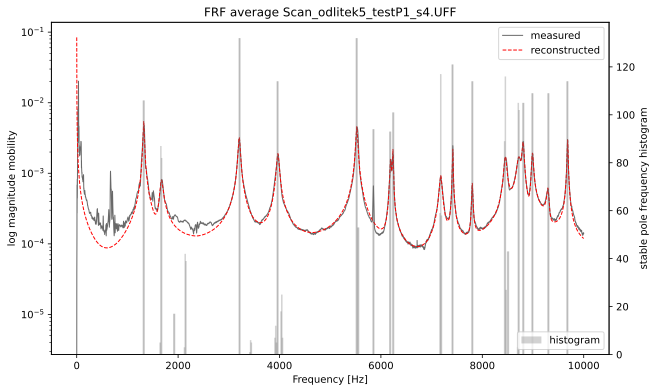

In [23]:
p54 = proc('Scan_odlitek5_testP1_s4.UFF')

## Computing MAC criteria
Below, MAC criteria comparing all measurements with first measurement of part 1 (choosen as reference) are computed. MAC criteria for identical models should be identity matrix. It is clear that modal shapes are similar among all parts, which suggests very precise modal parameter identification.

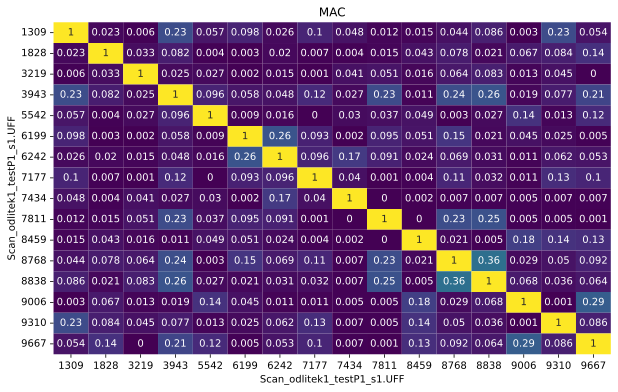

In [24]:
MAC11 = tl.prettyMAC(p11, p11)

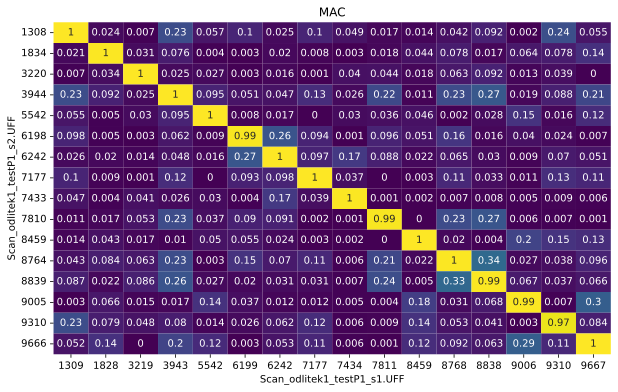

In [25]:
MAC12 = tl.prettyMAC(p11, p12)

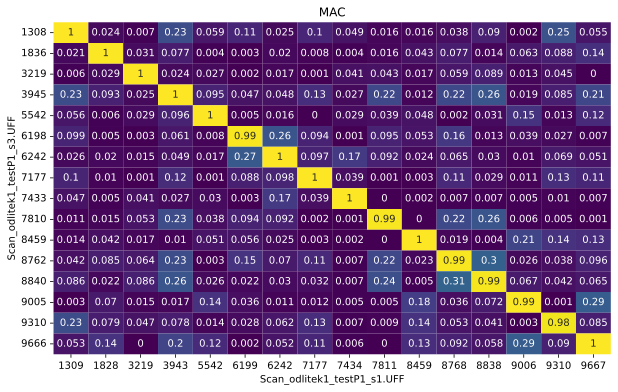

In [26]:
MAC13 = tl.prettyMAC(p11, p13)

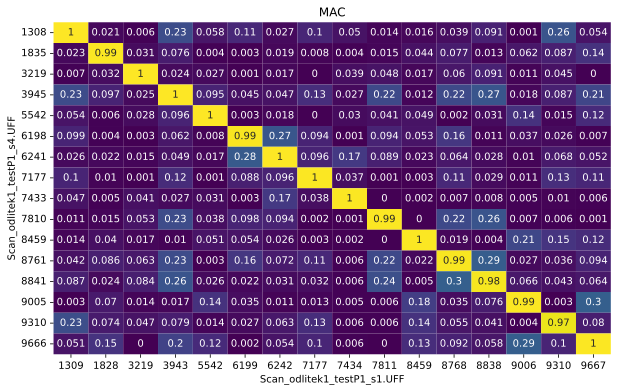

In [27]:
MAC14 = tl.prettyMAC(p11, p14)

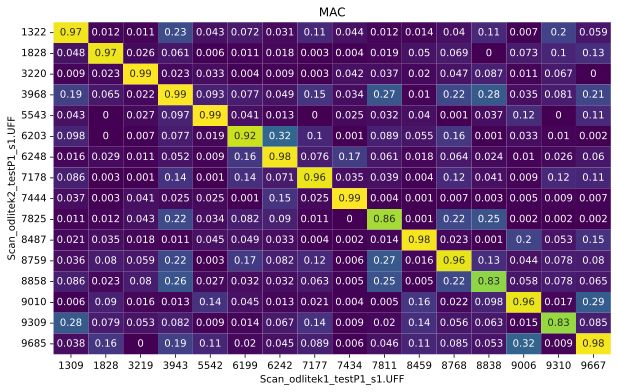

In [28]:
MAC21 = tl.prettyMAC(p11, p21)

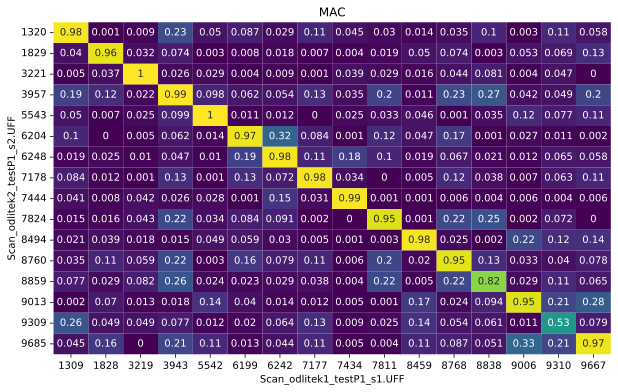

In [29]:
MAC22 = tl.prettyMAC(p11, p22)

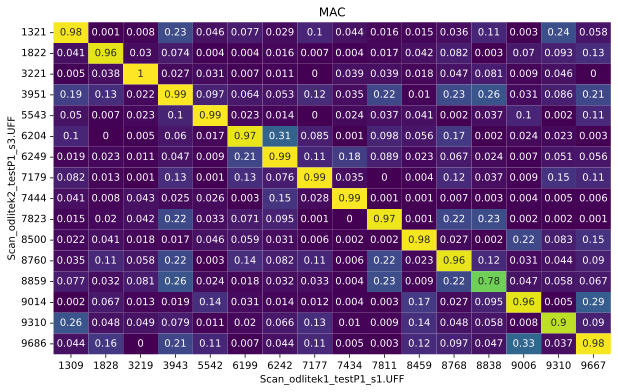

In [30]:
MAC23 = tl.prettyMAC(p11, p23)

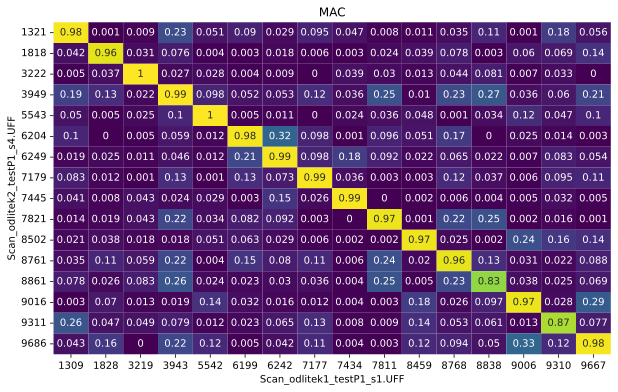

In [31]:
MAC24 = tl.prettyMAC(p11, p24)

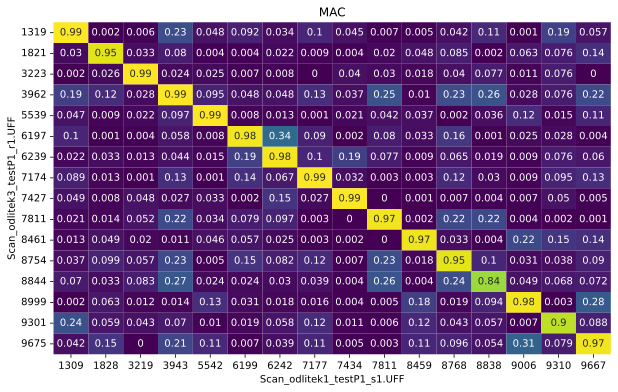

In [32]:
MAC31 = tl.prettyMAC(p11, p31)

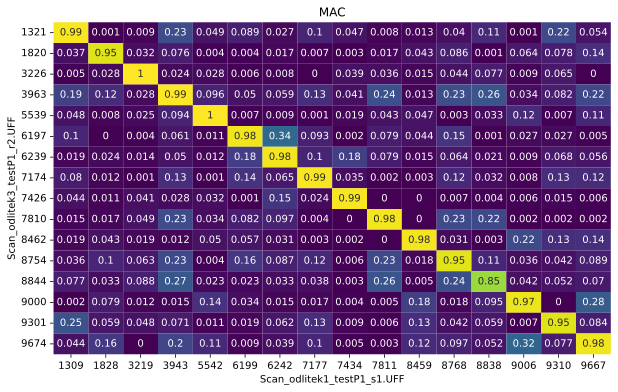

In [33]:
MAC32 = tl.prettyMAC(p11, p32)

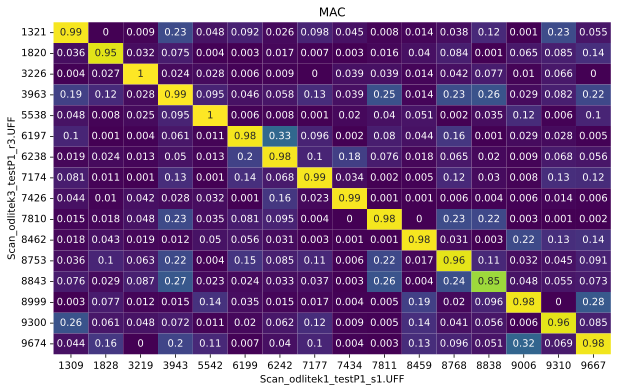

In [34]:
MAC33 = tl.prettyMAC(p11, p33)

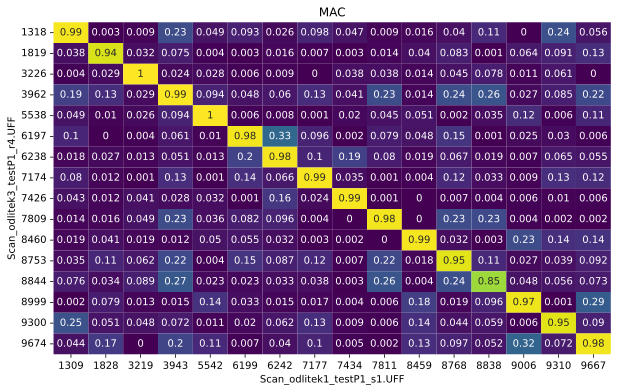

In [35]:
MAC34 = tl.prettyMAC(p11, p34)

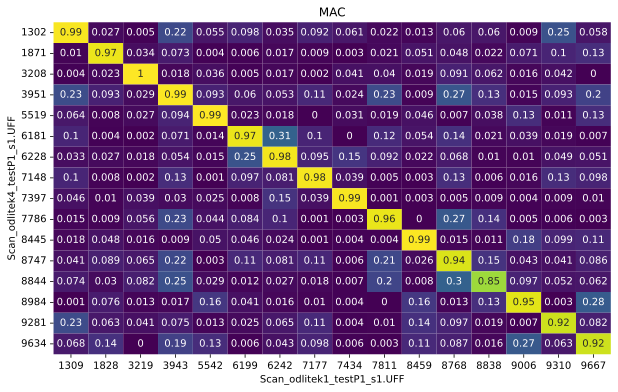

In [36]:
MAC41 = tl.prettyMAC(p11, p41)

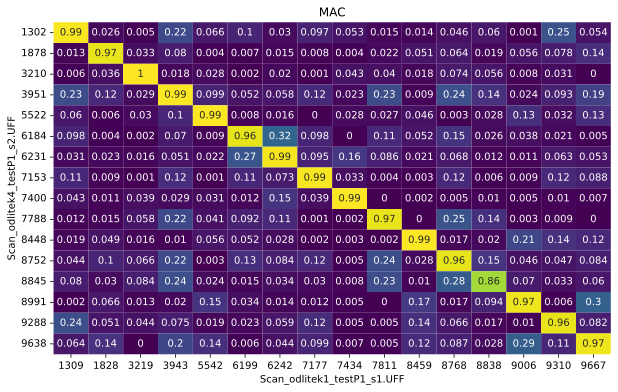

In [37]:
MAC42 = tl.prettyMAC(p11, p42)

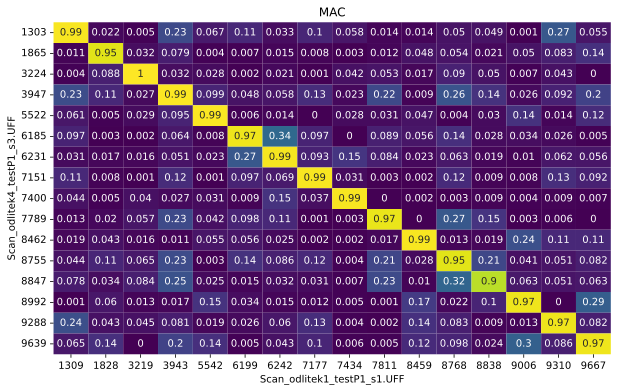

In [38]:
MAC43 = tl.prettyMAC(p11, p43)

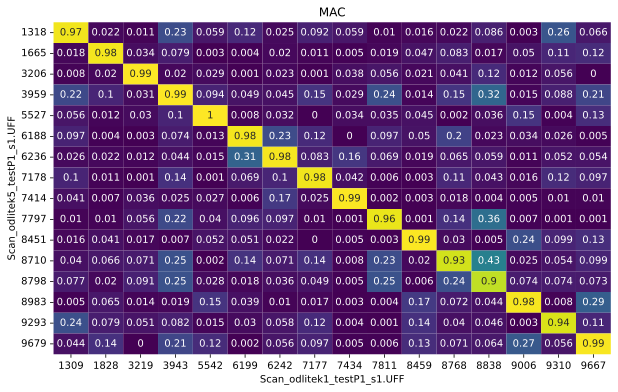

In [39]:
MAC51 = tl.prettyMAC(p11, p51)

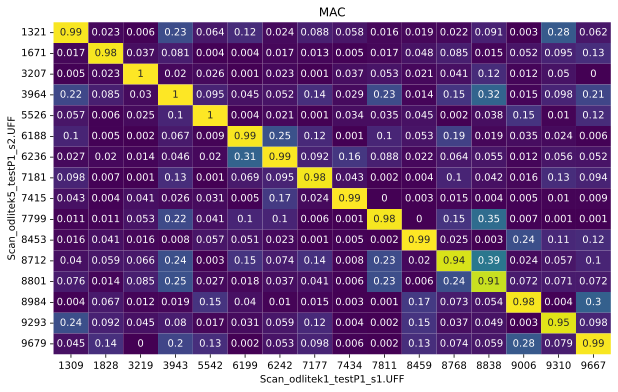

In [40]:
MAC52 = tl.prettyMAC(p11, p52)

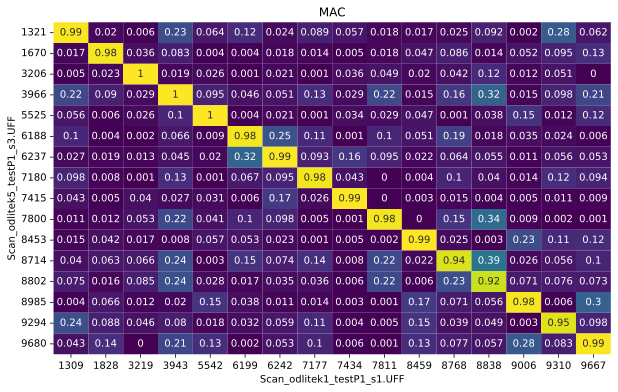

In [41]:
MAC53 = tl.prettyMAC(p11, p53)

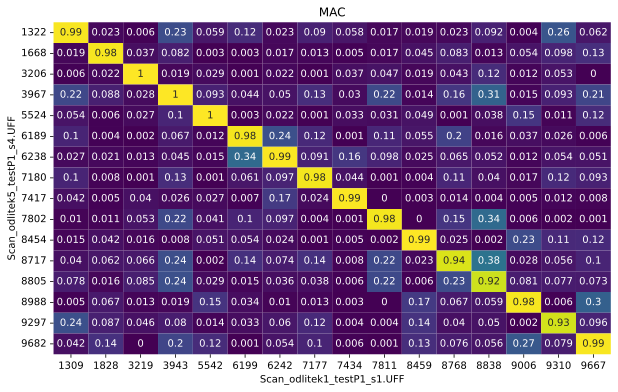

In [42]:
MAC54 = tl.prettyMAC(p11, p54)

# PCA Processing

## Dataframe with features 
Following code cell creates dataframe with features: natural frequency **nat_freq**, **damping**, flattened eigenvectors **eig_vec** and diagonal of MAC matrix with reference measurement p11 **MAC_diag**. This dataframe is later used to produce **x** matrix for PCA.

In [43]:
backend_ =  mpl.get_backend() 
mpl.use("Agg")  # Prevent showing figures

df = pd.DataFrame(columns=['name', 'nat_freq', 'damping', 'eig_vec', 'MAC_diag']) # dataframe with predefined features

# Each measurement list measurements is processed into row of features in dataframe
for meas in measurements:
    
    eig_vec = meas.model.A.flatten() # Gets flattened matrix of eigenvectors
    
    MAC_diag = tl.prettyMAC(p11, meas, show_plot=False).to_numpy().diagonal() # Gets diagonal of MAC with reference measurement
    
    df.loc[len(df.index)] = [
                            meas.name,
                            meas.nat_freq,
                            meas.nat_xi,
                            eig_vec,
                            MAC_diag
                            ]

mpl.use(backend_)

## Labels for classification of data
The following code needs to be modified manually in order to determine which measurement in the measurements list i.e. in dataframe belongs to which group. This setting has no effect on PCA computation, it is used only for plotting the results with respective colors and labels. 

In [44]:
Labels = [0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4]
Colors = ['lightsteelblue', 'royalblue', 'navy', 'firebrick', 'lightsalmon']
target_names = ['part_1_unbroken', 'part_2_unbroken', 'part_3_unbroken', 'part_4_broken', 'part_5_broken']

## PCA of matrices based on selected features
The following code creates plots with PCA of different features, which may be selected as a list of strings corresponding to df dataframe column names (more features may be chosen). The best results were achieved with PCA of natural frequency, where the measurements of the same parts were clustering closely together.

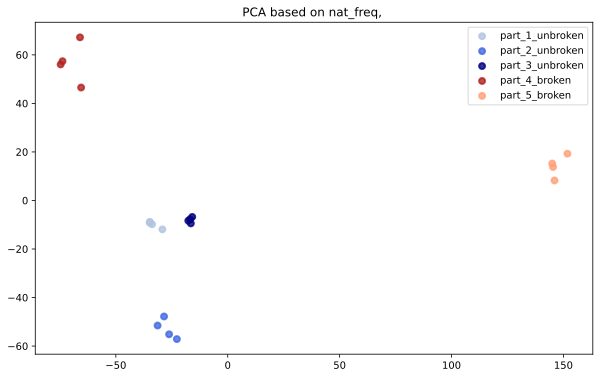

In [45]:
features = ['nat_freq']
pca = stat.PCA(df, features, Labels, Colors, target_names)

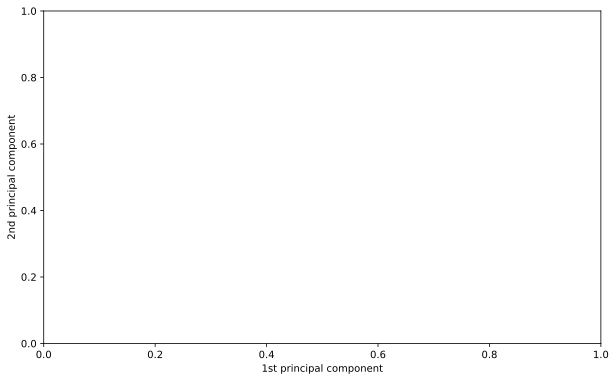

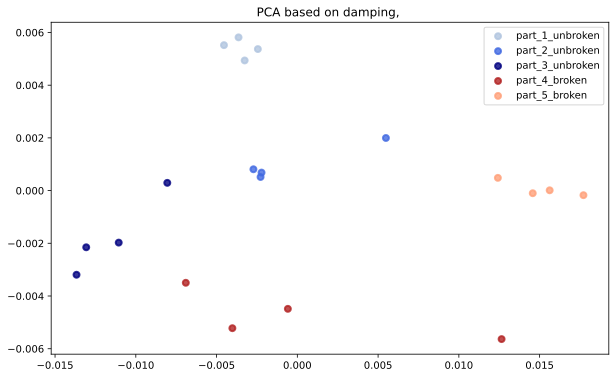

In [46]:
features = ['damping']
pca = stat.PCA(df, features, Labels, Colors, target_names)

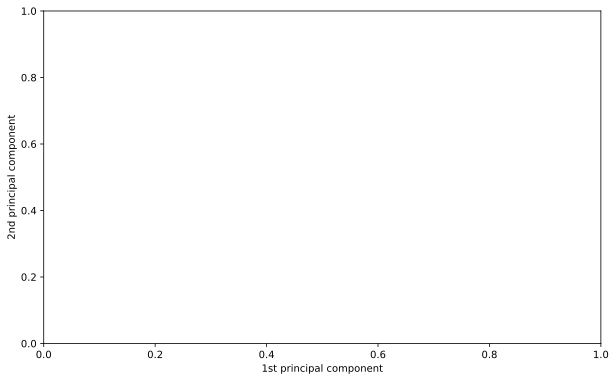

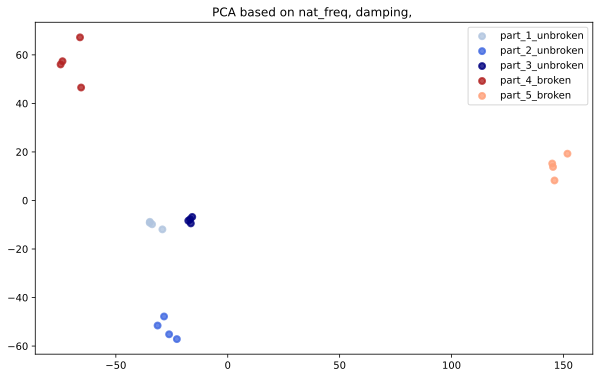

In [47]:
features = ['nat_freq', 'damping'] # data are centered but not z-scored, nat_freq will be probably dominant
pca = stat.PCA(df, features, Labels, Colors, target_names)

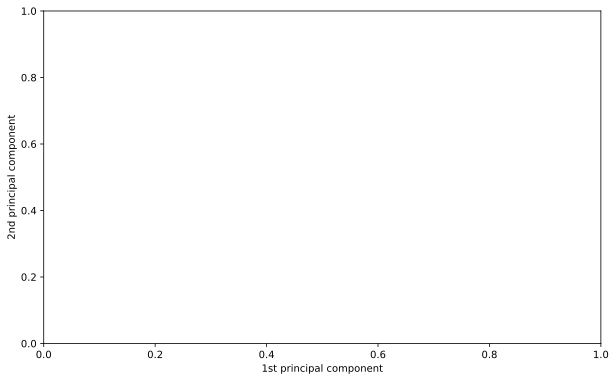

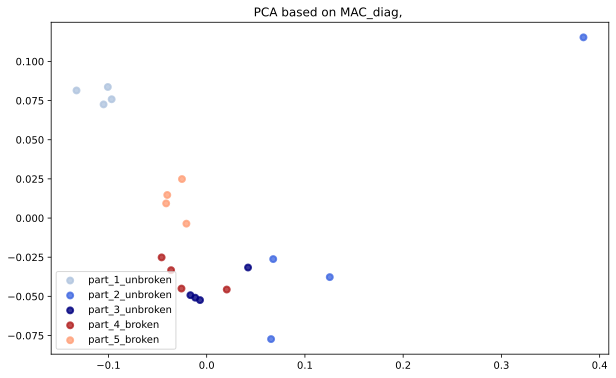

In [48]:
features = ['MAC_diag']
pca = stat.PCA(df, features, Labels, Colors, target_names)

## PCA of derived features
It is also possible to derive new features from those already in dataframe, as codecell below shows. Following plots show PCA of those derived features, interesting results were achieved from PCA of eigenvector angles in complex space **angle_vec**.

In [49]:
df['abs_vec'] = df['eig_vec'].apply(lambda x: np.abs(x)) # Deriving new feature - absolute value of complex eigenvector

df['real_vec'] = df['eig_vec'].apply(lambda x: np.real(x)) # Deriving new feature - real part vector from complex eigenvector

df['angle_vec'] = df['eig_vec'].apply(lambda x: np.angle(x)) # New feature - angle in complex space from complex eigenvector

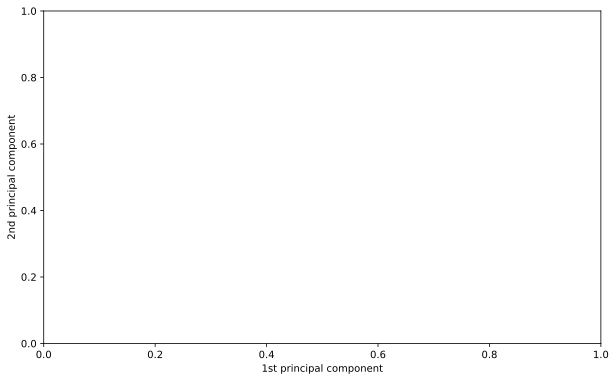

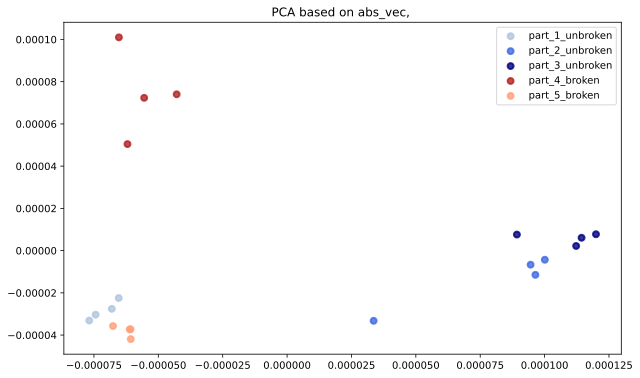

In [50]:
features = ['abs_vec']
pca = stat.PCA(df, features, Labels, Colors, target_names)

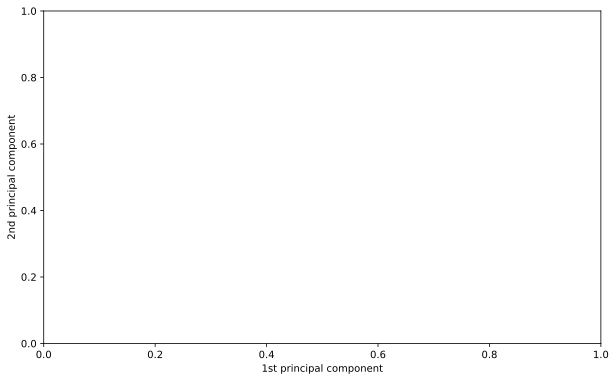

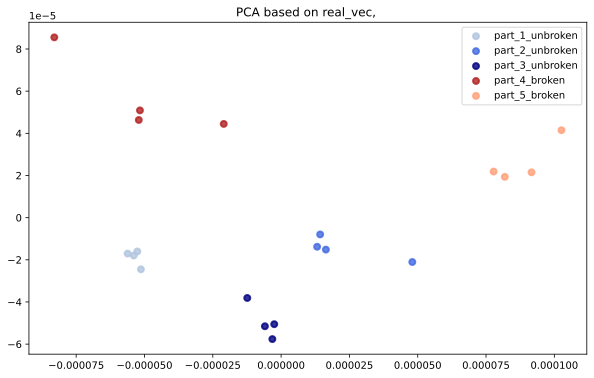

In [51]:
features = ['real_vec']
pca = stat.PCA(df, features, Labels, Colors, target_names)

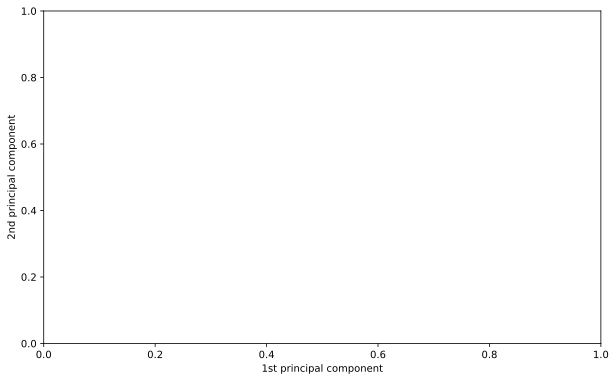

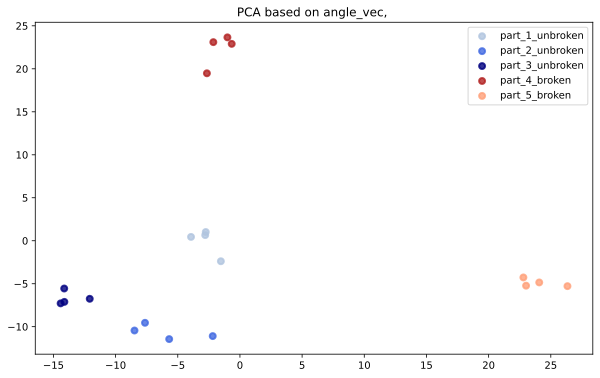

In [52]:
features = ['angle_vec']
pca = stat.PCA(df, features, Labels, Colors, target_names)

# Summary
The aim of this project is to develop a method, which would classify aluminum casted parts into two groups - defective and non-defective.

After multiple iterations, it was possible to obtain data with good quality, so that they could be properly fitted by EMA algorithms. Those algorithms were modified so that data from more parts with shifting eigenfrequencies could be processed automatically, producing features comparable among all separate measurements.
PCA was then used on different obtained features in order to determine which feature is a good indicator of differences among parts.

So far, PCA plots suggest that it may be possible to classify the data into two groups by their health.
However, to determine this certainly, more measurements may be needed. Best modal parameter for this classification seems to be modal frequencies.